<a href="https://colab.research.google.com/github/taniyagidatkar/CarpriceAnalysis.ipynb/blob/main/Car_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.impute import SimpleImputer
import plotly.express as px
import seaborn as sns
sns.set(
    { "figure.figsize": (6, 4) },
    style='ticks',
    color_codes=True,
    font_scale=0.8
)
%config InlineBackend.figure_format = 'retina'
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# load the data
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
# I gave the dataframe name data
data = pd.read_csv('/content/gdrive/MyDrive/Pods Assessment/adverts.csv')

In [ ]:
data.head()

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
0,202006039777689,0.0,NaN,Grey,Volvo,XC90,NEW,NaN,73970,SUV,False,Petrol Plug-in Hybrid
1,202007020778260,108230.0,61,Blue,Jaguar,XF,USED,2011.0,7000,Saloon,False,Diesel
2,202007020778474,7800.0,17,Grey,SKODA,Yeti,USED,2017.0,14000,SUV,False,Petrol
3,202007080986776,45000.0,16,Brown,Vauxhall,Mokka,USED,2016.0,7995,Hatchback,False,Diesel
4,202007161321269,64000.0,64,Grey,Land Rover,Range Rover Sport,USED,2015.0,26995,SUV,False,Diesel


public_reference: Unique code number.

mileage: The no. of miles the car/taxi has drove.

reg_code: UK registration code.

standard_colour: Color of the motor-vehicle.

standard_make: Name of the motor vehicle. eg skoda, mercedes, etc.

standard_model: Model of the vehicle.

vehicle_condition: It tells the condition of the vehicle.

year_of_registration: the year when car was registred.

price: The price of the cars.

body_type: This column identifies the body type of the vehicle, such as car, van, or motorcycle.

crossover_car_and_van: Crossover between car and van, indicating vehicles that have features of both categories.

fuel_type: fuel types such as petrol, diesel, electric, bi electric, hybrid.


In [ ]:
data.tail(10)

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
401995,202010305624221,53460.0,10,Blue,SEAT,Ibiza,USED,2010.0,3795,Estate,False,Petrol
401996,202010315639231,45000.0,15,Silver,Vauxhall,Corsa,USED,2015.0,5000,Hatchback,False,Petrol
401997,202010315647416,4075.0,69,Grey,Nissan,Juke,USED,2019.0,18000,SUV,False,Petrol
401998,202010315649743,87078.0,53,Green,Honda,Jazz,USED,2003.0,995,Hatchback,False,Petrol
401999,202010315651841,74732.0,59,Blue,Toyota,Auris,USED,2009.0,2600,Hatchback,False,Petrol
402000,202010315652942,5179.0,69,Grey,Peugeot,208,USED,2019.0,10595,Hatchback,False,Petrol
402001,202010315657341,110000.0,59,Red,Peugeot,107,USED,2009.0,2000,Hatchback,False,Petrol
402002,202010315659271,52760.0,62,White,Nissan,Qashqai,USED,2012.0,7250,SUV,False,Petrol
402003,202011015662436,10250.0,65,Red,Abarth,595,USED,2015.0,11490,Hatchback,False,Petrol
402004,201512149444029,14000.0,14,Silver,Audi,A4 Avant,USED,2014.0,20520,Estate,False,Diesel


In [ ]:
sample_data = data.sample(5)
print(sample_data)

        public_reference  mileage reg_code standard_colour standard_make  \
345271   202005289605316  76000.0       64             Red           BMW   
61621    202008082241235  18446.0       16           Black          Audi   
38381    202009123652537   7370.0       69            Blue    Volkswagen   
109341   202010104830693     10.0       70            Blue      Vauxhall   
200769   202006260545062  19655.0       17           White       Hyundai   

       standard_model vehicle_condition  year_of_registration  price  \
345271       2 Series              USED                2014.0  11999   
61621              A3              USED                2016.0  15000   
38381            Golf              USED                2019.0  13750   
109341          Corsa              USED                2020.0  15500   
200769         Tucson              USED                2017.0  13995   

        body_type  crossover_car_and_van fuel_type  
345271      Coupe                  False    Diesel  
6162

## reshaping

In [ ]:
data.T

,0,1,2,3,4,5,6,7,8,9,...,401995,401996,401997,401998,401999,402000,402001,402002,402003,402004
public_reference,202006039777689,202007020778260,202007020778474,202007080986776,202007161321269,202009304412074,202007080998445,202009244143980,202010014442611,202006230431327,...,202010305624221,202010315639231,202010315647416,202010315649743,202010315651841,202010315652942,202010315657341,202010315659271,202011015662436,201512149444029
mileage,0.0,108230.0,7800.0,45000.0,64000.0,16000.0,24075.0,99000.0,111236.0,9500.0,...,53460.0,45000.0,4075.0,87078.0,74732.0,5179.0,110000.0,52760.0,10250.0,14000.0
reg_code,NaN,61,17,16,64,17,17,13,08,19,...,10,15,69,53,59,69,59,62,65,14
standard_colour,Grey,Blue,Grey,Brown,Grey,Blue,Red,Bronze,Black,White,...,Blue,Silver,Grey,Green,Blue,Grey,Red,White,Red,Silver
standard_make,Volvo,Jaguar,SKODA,Vauxhall,Land Rover,Audi,Vauxhall,Land Rover,Mercedes-Benz,Land Rover,...,SEAT,Vauxhall,Nissan,Honda,Toyota,Peugeot,Peugeot,Nissan,Abarth,Audi
standard_model,XC90,XF,Yeti,Mokka,Range Rover Sport,S5,Viva,Range Rover,S Class,Range Rover,...,Ibiza,Corsa,Juke,Jazz,Auris,208,107,Qashqai,595,A4 Avant
vehicle_condition,NEW,USED,USED,USED,USED,USED,USED,USED,USED,USED,...,USED,USED,USED,USED,USED,USED,USED,USED,USED,USED
year_of_registration,NaN,2011.0,2017.0,2016.0,2015.0,2017.0,2017.0,2013.0,2008.0,2019.0,...,2010.0,2015.0,2019.0,2003.0,2009.0,2019.0,2009.0,2012.0,2015.0,2014.0
price,73970,7000,14000,7995,26995,29000,5861,24475,6995,79995,...,3795,5000,18000,995,2600,10595,2000,7250,11490,20520
body_type,SUV,Saloon,SUV,Hatchback,SUV,Convertible,Hatchback,SUV,Limousine,SUV,...,Estate,Hatchback,SUV,Hatchback,Hatchback,Hatchback,Hatchback,SUV,Hatchback,Estate


In [ ]:
data.index

RangeIndex(start=0, stop=402005, step=1)

In [ ]:
data.columns

Index(['public_reference', 'mileage', 'reg_code', 'standard_colour',
       'standard_make', 'standard_model', 'vehicle_condition',
       'year_of_registration', 'price', 'body_type', 'crossover_car_and_van',
       'fuel_type'],
      dtype='object')

In [ ]:
data.shape

(402005, 12)

In [ ]:
data.size

4824060

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 402005 entries, 0 to 402004
Data columns (total 12 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   public_reference       402005 non-null  int64  
 1   mileage                401878 non-null  float64
 2   reg_code               370148 non-null  object 
 3   standard_colour        396627 non-null  object 
 4   standard_make          402005 non-null  object 
 5   standard_model         402005 non-null  object 
 6   vehicle_condition      402005 non-null  object 
 7   year_of_registration   368694 non-null  float64
 8   price                  402005 non-null  int64  
 9   body_type              401168 non-null  object 
 10  crossover_car_and_van  402005 non-null  bool   
 11  fuel_type              401404 non-null  object 
dtypes: bool(1), float64(2), int64(2), object(7)
memory usage: 34.1+ MB


In [ ]:
data.describe(include='all')

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
count,4.020050e+05,401878.000000,370148,396627,402005,402005,402005,368694.000000,4.020050e+05,401168,402005,401404
unique,NaN,NaN,72,22,110,1168,2,NaN,NaN,16,2,9
top,NaN,NaN,17,Black,BMW,Golf,USED,NaN,NaN,Hatchback,False,Petrol
freq,NaN,NaN,36738,86287,37376,11583,370756,NaN,NaN,167315,400210,216929
mean,2.020071e+14,37743.595656,NaN,NaN,NaN,NaN,NaN,2015.006206,1.734197e+04,NaN,NaN,NaN
std,1.691662e+10,34831.724018,NaN,NaN,NaN,NaN,NaN,7.962667,4.643746e+04,NaN,NaN,NaN
min,2.013072e+14,0.000000,NaN,NaN,NaN,NaN,NaN,999.000000,1.200000e+02,NaN,NaN,NaN
25%,2.020090e+14,10481.000000,NaN,NaN,NaN,NaN,NaN,2013.000000,7.495000e+03,NaN,NaN,NaN
50%,2.020093e+14,28629.500000,NaN,NaN,NaN,NaN,NaN,2016.000000,1.260000e+04,NaN,NaN,NaN
75%,2.020102e+14,56875.750000,NaN,NaN,NaN,NaN,NaN,2018.000000,2.000000e+04,NaN,NaN,NaN


In [ ]:
# Identifying Quantitative and Qualitative Features
quantitative_features = data.select_dtypes(include=['float64', 'int64']).columns.tolist()
qualitative_features = data.select_dtypes(include=['object', 'bool']).columns.tolist()
print("Quantitative Features:", quantitative_features)
print("Qualitative Features:", qualitative_features)

Quantitative Features: ['public_reference', 'mileage', 'year_of_registration', 'price']
Qualitative Features: ['reg_code', 'standard_colour', 'standard_make', 'standard_model', 'vehicle_condition', 'body_type', 'crossover_car_and_van', 'fuel_type']


In [ ]:
data_distribution = data[quantitative_features].describe()
print(data_distribution)

       public_reference        mileage  year_of_registration         price
count      4.020050e+05  401878.000000         368694.000000  4.020050e+05
mean       2.020071e+14   37743.595656           2015.006206  1.734197e+04
std        1.691662e+10   34831.724018              7.962667  4.643746e+04
min        2.013072e+14       0.000000            999.000000  1.200000e+02
25%        2.020090e+14   10481.000000           2013.000000  7.495000e+03
50%        2.020093e+14   28629.500000           2016.000000  1.260000e+04
75%        2.020102e+14   56875.750000           2018.000000  2.000000e+04
max        2.020110e+14  999999.000000           2020.000000  9.999999e+06


In [ ]:
# Checking for missing values
missing_values = data.isnull().sum()
Q1 = data[quantitative_features].quantile(0.25)
Q3 = data[quantitative_features].quantile(0.75)
IQR = Q3 - Q1
outliers = ((data[quantitative_features] < (Q1 - 1.5 * IQR)) | (data[quantitative_features] > (Q3 + 1.5 * IQR))).sum()
missing_values,outliers

(public_reference             0
 mileage                    127
 reg_code                 31857
 standard_colour           5378
 standard_make                0
 standard_model               0
 vehicle_condition            0
 year_of_registration     33311
 price                        0
 body_type                  837
 crossover_car_and_van        0
 fuel_type                  601
 dtype: int64,
 public_reference        54649
 mileage                  8181
 year_of_registration    11915
 price                   26269
 dtype: int64)

In [ ]:
data= data.set_index('public_reference')

In [ ]:
missing_columns = data.columns[data.isnull().any()].tolist()

In [ ]:
missing_columns

['mileage',
 'reg_code',
 'standard_colour',
 'year_of_registration',
 'body_type',
 'fuel_type']

In [ ]:
# numerical_columns = data.select_dtypes(include='number').columns.tolist()
# categorical_columns = list(set(data.columns) - set(numerical_columns))

In [ ]:
# numerical_imputer = SimpleImputer(strategy='mean')
# data[numerical_columns] = numerical_imputer.fit_transform(data[numerical_columns])

In [ ]:
# categorical_imputer = SimpleImputer(strategy='most_frequent')
# data[categorical_columns] = categorical_imputer.fit_transform(data[categorical_columns])

In [ ]:
# checking the dataset again
data

,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
public_reference,,,,,,,,,,,
202006039777689,0.0,NaN,Grey,Volvo,XC90,NEW,NaN,73970,SUV,False,Petrol Plug-in Hybrid
202007020778260,108230.0,61,Blue,Jaguar,XF,USED,2011.0,7000,Saloon,False,Diesel
202007020778474,7800.0,17,Grey,SKODA,Yeti,USED,2017.0,14000,SUV,False,Petrol
202007080986776,45000.0,16,Brown,Vauxhall,Mokka,USED,2016.0,7995,Hatchback,False,Diesel
202007161321269,64000.0,64,Grey,Land Rover,Range Rover Sport,USED,2015.0,26995,SUV,False,Diesel
...,...,...,...,...,...,...,...,...,...,...,...
202010315652942,5179.0,69,Grey,Peugeot,208,USED,2019.0,10595,Hatchback,False,Petrol
202010315657341,110000.0,59,Red,Peugeot,107,USED,2009.0,2000,Hatchback,False,Petrol
202010315659271,52760.0,62,White,Nissan,Qashqai,USED,2012.0,7250,SUV,False,Petrol


In [ ]:
# checking the used cars by using other df name
filtered_data = data[data['vehicle_condition']== 'USED']
filtered_data.sample(10)

,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
public_reference,,,,,,,,,,,
202006190299854,82000.0,65,Grey,Toyota,Auris,USED,2015.0,4995,Estate,False,Diesel
202008293093339,13754.0,19,Red,Vauxhall,Corsa,USED,2019.0,8336,Hatchback,False,Petrol
202008252900021,50000.0,15,Black,MINI,Hatch,USED,2015.0,9195,Hatchback,False,Petrol
202003318808556,1181.0,70,White,Audi,Q2,USED,2020.0,32000,SUV,False,Diesel
202009284293870,62075.0,57,Blue,Peugeot,207,USED,2007.0,1995,Hatchback,False,Petrol
202010084769554,24883.0,66,White,Vauxhall,Mokka,USED,2016.0,10495,Hatchback,False,Petrol
202009183885054,5.0,70,White,Dacia,Duster,USED,2020.0,12000,SUV,False,Petrol
202009274269189,37000.0,14,Black,Vauxhall,Insignia,USED,2014.0,7990,Hatchback,False,Diesel
202009173847339,19713.0,66,Blue,Audi,Q3,USED,2016.0,17995,SUV,False,Diesel


In [ ]:
filtered_data.isnull().sum()


mileage                   127
reg_code                  608
standard_colour          4338
standard_make               0
standard_model              0
vehicle_condition           0
year_of_registration     2062
price                       0
body_type                 781
crossover_car_and_van       0
fuel_type                 440
dtype: int64

In [ ]:
data

,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
public_reference,,,,,,,,,,,
202006039777689,0.0,NaN,Grey,Volvo,XC90,NEW,NaN,73970,SUV,False,Petrol Plug-in Hybrid
202007020778260,108230.0,61,Blue,Jaguar,XF,USED,2011.0,7000,Saloon,False,Diesel
202007020778474,7800.0,17,Grey,SKODA,Yeti,USED,2017.0,14000,SUV,False,Petrol
202007080986776,45000.0,16,Brown,Vauxhall,Mokka,USED,2016.0,7995,Hatchback,False,Diesel
202007161321269,64000.0,64,Grey,Land Rover,Range Rover Sport,USED,2015.0,26995,SUV,False,Diesel
...,...,...,...,...,...,...,...,...,...,...,...
202010315652942,5179.0,69,Grey,Peugeot,208,USED,2019.0,10595,Hatchback,False,Petrol
202010315657341,110000.0,59,Red,Peugeot,107,USED,2009.0,2000,Hatchback,False,Petrol
202010315659271,52760.0,62,White,Nissan,Qashqai,USED,2012.0,7250,SUV,False,Petrol


In [ ]:
# # Feature Engineering: Creating a new feature 'vehicle_age'
# current_year = 2024
# data['vehicle_age'] = current_year - filtered_data['year_of_registration']
# data.loc[data['vehicle_condition'] == 'new', 'vehicle_age'] = 0

# # Updating the list of quantitative features to include 'vehicle_age'
# quantitative_features.append('vehicle_age')

# # Rechecking the distribution of 'vehicle_age' and its potential outliers
# vehicle_age_distribution = data['vehicle_age'].describe()
# vehicle_age_outliers = ((data['vehicle_age'] < (vehicle_age_distribution['25%'] - 1.5 * (vehicle_age_distribution['75%'] - vehicle_age_distribution['25%']))) |
#                         (data['vehicle_age'] > (vehicle_age_distribution['75%'] + 1.5 * (vehicle_age_distribution['75%'] - vehicle_age_distribution['25%'])))).sum()

# vehicle_age_distribution, vehicle_age_outliers

In [ ]:
# here i changed the df to original one as i didnt wanted to make another copy of the dataset
data.update(filtered_data)

In [ ]:
data.isnull().sum()


mileage                    127
reg_code                 31857
standard_colour           5378
standard_make                0
standard_model               0
vehicle_condition            0
year_of_registration     33311
price                        0
body_type                  837
crossover_car_and_van        0
fuel_type                  601
dtype: int64

In [ ]:
# Setting year_of_registration to 2020
data['year_of_registration'].fillna(2020, inplace=True)

In [ ]:
data['reg_code'].fillna(70, inplace=True)

In [ ]:
numerical_columns = data.select_dtypes(include='number').columns.tolist()
categorical_columns = list(set(data.columns) - set(numerical_columns))

numerical_imputer = SimpleImputer(strategy='mean')
data[numerical_columns] = numerical_imputer.fit_transform(data[numerical_columns])

categorical_imputer = SimpleImputer(strategy='most_frequent')
data[categorical_columns] = categorical_imputer.fit_transform(data[categorical_columns])


In [ ]:
# making sure whether there aren't  any null values in the dataset
data.isnull().sum()


mileage                  0
reg_code                 0
standard_colour          0
standard_make            0
standard_model           0
vehicle_condition        0
year_of_registration     0
price                    0
body_type                0
crossover_car_and_van    0
fuel_type                0
dtype: int64

In [ ]:
data

,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
public_reference,,,,,,,,,,,
202006039777689,0.0,70,Grey,Volvo,XC90,NEW,2020.0,73970.0,SUV,False,Petrol Plug-in Hybrid
202007020778260,108230.0,61,Blue,Jaguar,XF,USED,2011.0,7000.0,Saloon,False,Diesel
202007020778474,7800.0,17,Grey,SKODA,Yeti,USED,2017.0,14000.0,SUV,False,Petrol
202007080986776,45000.0,16,Brown,Vauxhall,Mokka,USED,2016.0,7995.0,Hatchback,False,Diesel
202007161321269,64000.0,64,Grey,Land Rover,Range Rover Sport,USED,2015.0,26995.0,SUV,False,Diesel
...,...,...,...,...,...,...,...,...,...,...,...
202010315652942,5179.0,69,Grey,Peugeot,208,USED,2019.0,10595.0,Hatchback,False,Petrol
202010315657341,110000.0,59,Red,Peugeot,107,USED,2009.0,2000.0,Hatchback,False,Petrol
202010315659271,52760.0,62,White,Nissan,Qashqai,USED,2012.0,7250.0,SUV,False,Petrol


In [ ]:
# kde plot using for visualizing continuous variables

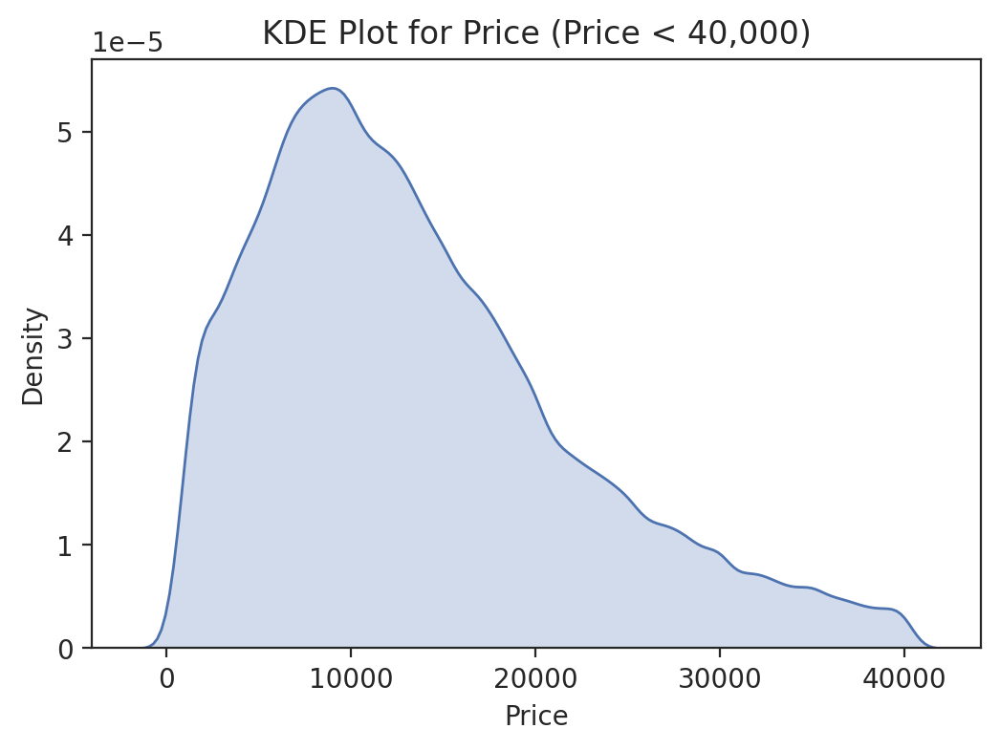

In [ ]:
data = data[data['price'] < 40000]
sns.kdeplot(data=data, x="price", label="price", fill=True)
plt.xlabel("Price")
plt.ylabel("Density")
plt.title("KDE Plot for Price (Price < 40,000)")
plt.show()


In [ ]:
data['price'].describe()

count    378275.000000
mean      13638.603931
std        8573.131322
min         120.000000
25%        7150.000000
50%       11995.000000
75%       18490.000000
max       39999.000000
Name: price, dtype: float64

Text(0, 0.5, 'Density')

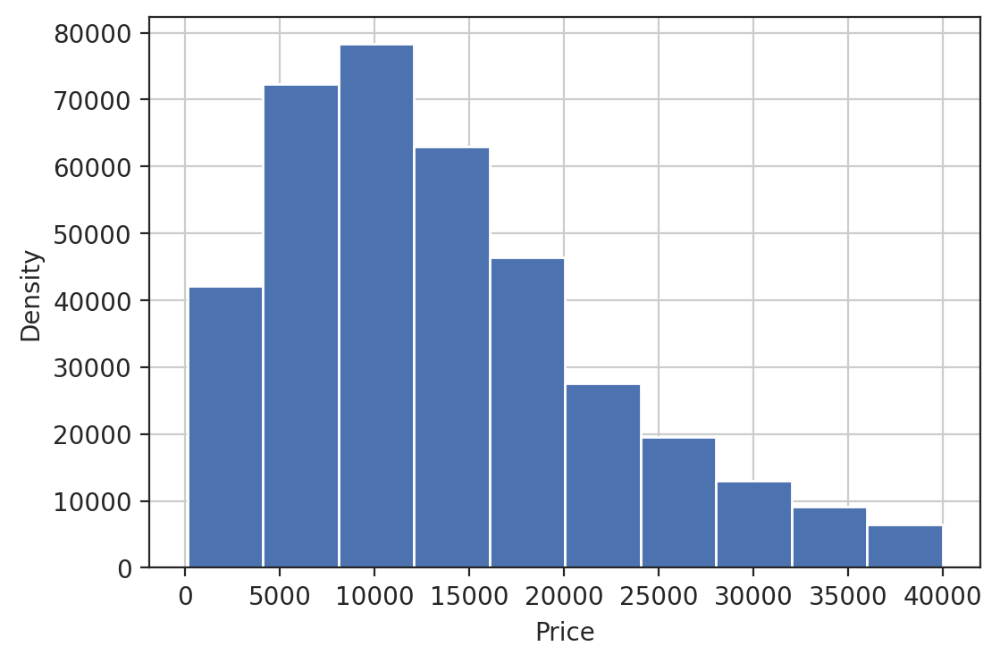

In [ ]:
#histogram plot to check the distribution of values
data['price'].hist(bins=10)
plt.xlabel("Price")
plt.ylabel("Density")

## outliers

count    378275.000000
mean      39519.633260
std       34957.744783
min           0.000000
25%       12473.000000
50%       30531.000000
75%       59000.000000
max      999999.000000
Name: mileage, dtype: float64


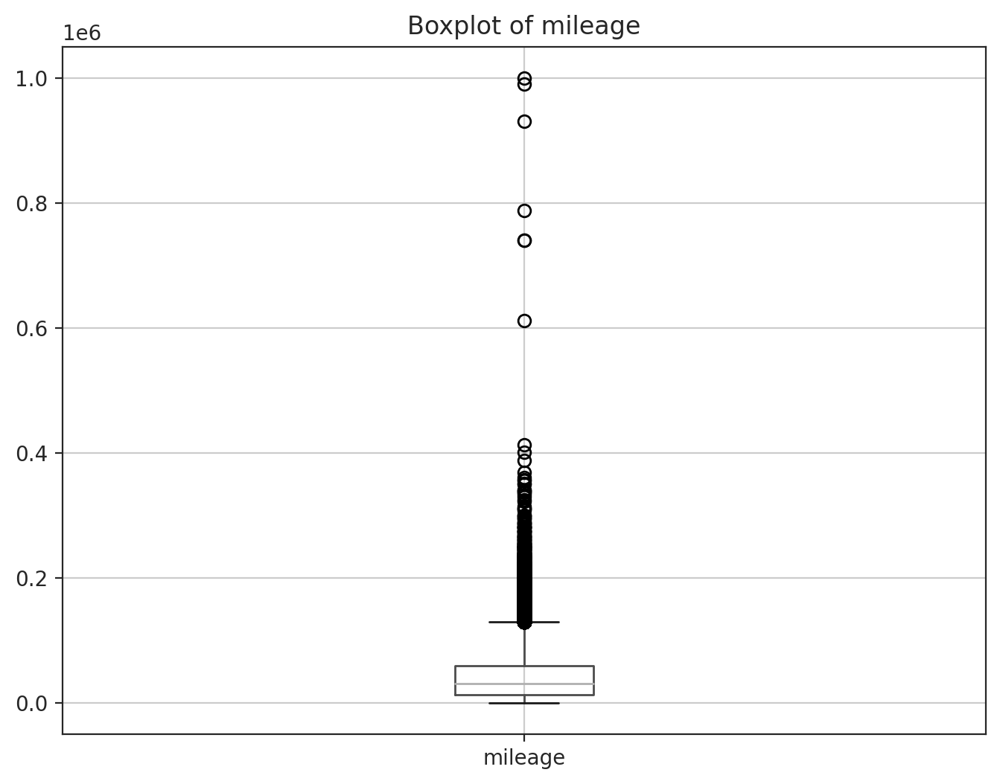

In [ ]:
# Assuming 'numeric_column' is the column you want to check for outliers
numeric_column = 'mileage'

print(data[numeric_column].describe())

plt.figure(figsize=(8, 6))
data.boxplot(column=numeric_column)
plt.title('Boxplot of ' + numeric_column)
plt.show()

In [ ]:
# # Assuming 'mileage'
# numeric_column = 'mileage'

# lower_bound = data[numeric_column].quantile(0.05)
# upper_bound = data[numeric_column].quantile(0.95)

# # Filtering dataset to keep values within the defined range
# data = data[(data[numeric_column] >= lower_bound) & (data[numeric_column] <= upper_bound)]

# # Visualizing without the outliers
# plt.figure(figsize=(8, 6))
# data.boxplot(column=numeric_column)
# plt.title('Boxplot of ' + numeric_column + ' without outliers')
# plt.show()

In [ ]:
# i didnt wanted the lower quantile as i wanted to include the 0 in the calculation and i have set upper quantile to 0.80
# because i wanted to reduce the the ranging of graph

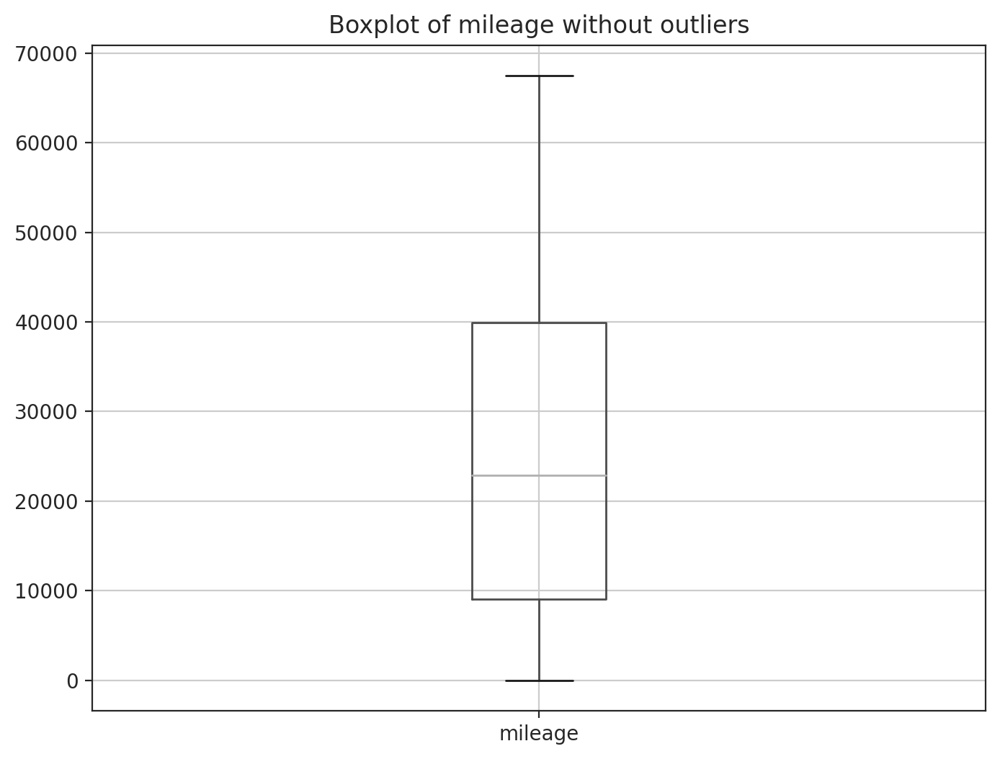

In [ ]:
#mileage
numeric_column = 'mileage'
upper_bound = data[numeric_column].quantile(0.80)
data1 = data[(data[numeric_column] <= upper_bound)]
# Visualizing without outliers
plt.figure(figsize=(8, 6))
data1.boxplot(column=numeric_column)
plt.title('Boxplot of ' + numeric_column + ' without outliers')
plt.show()

Text(0.5, 0, 'Original Data')

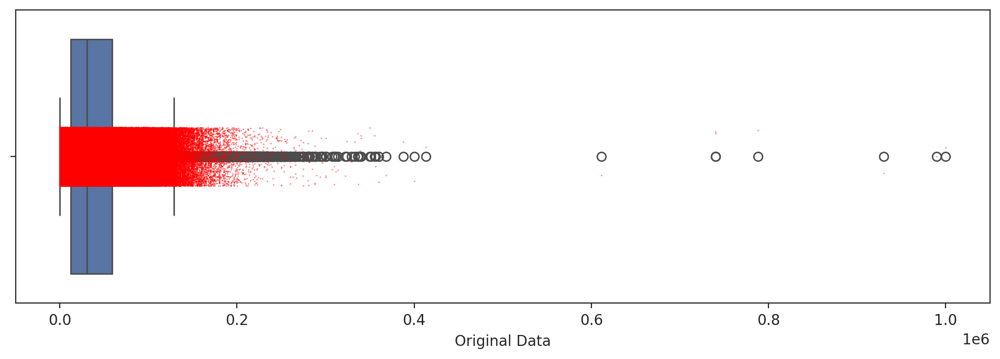

In [ ]:
numeric_column = 'mileage'
plt.figure(figsize=(12, 8))
# Boxplot with outliers and stripplot of data points for more detailed understanding
plt.subplot(2, 1, 1)
sns.boxplot(x=data[numeric_column])
sns.stripplot(x=data[numeric_column], color='red', size=1, jitter=True, alpha=0.5)
plt.xlabel('Original Data')


In [ ]:
# data looks very messy and unclear in the above graph so let's reduce the number for better presentation and understanding.
#  Also, we don't need the the values which are in the upper outlier as they are distint.

In [ ]:
data = data[data[numeric_column] <= 400000]
data

,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
public_reference,,,,,,,,,,,
202007020778260,108230.0,61,Blue,Jaguar,XF,USED,2011.0,7000.0,Saloon,False,Diesel
202007020778474,7800.0,17,Grey,SKODA,Yeti,USED,2017.0,14000.0,SUV,False,Petrol
202007080986776,45000.0,16,Brown,Vauxhall,Mokka,USED,2016.0,7995.0,Hatchback,False,Diesel
202007161321269,64000.0,64,Grey,Land Rover,Range Rover Sport,USED,2015.0,26995.0,SUV,False,Diesel
202009304412074,16000.0,17,Blue,Audi,S5,USED,2017.0,29000.0,Convertible,False,Petrol
...,...,...,...,...,...,...,...,...,...,...,...
202010315652942,5179.0,69,Grey,Peugeot,208,USED,2019.0,10595.0,Hatchback,False,Petrol
202010315657341,110000.0,59,Red,Peugeot,107,USED,2009.0,2000.0,Hatchback,False,Petrol
202010315659271,52760.0,62,White,Nissan,Qashqai,USED,2012.0,7250.0,SUV,False,Petrol


Text(0.5, 0, 'Original Data')

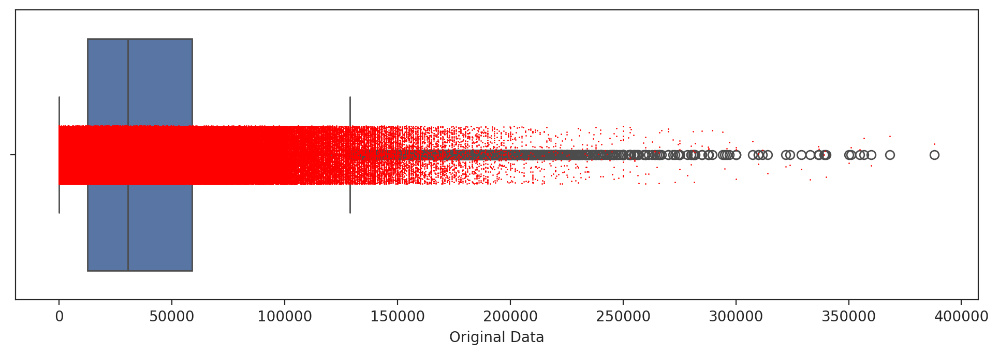

In [ ]:

# rechecking the plot
numeric_column = 'mileage'
plt.figure(figsize=(12, 8))
plt.subplot(2, 1, 1)
sns.boxplot(x=data[numeric_column])
sns.stripplot(x=data[numeric_column], color='red', size=1)
plt.xlabel('Original Data')


In [ ]:
# now the graph looks good and we can view it easily and it's less crowded.

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 378266 entries, 202007020778260 to 201512149444029
Data columns (total 11 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   mileage                378266 non-null  float64
 1   reg_code               378266 non-null  object 
 2   standard_colour        378266 non-null  object 
 3   standard_make          378266 non-null  object 
 4   standard_model         378266 non-null  object 
 5   vehicle_condition      378266 non-null  object 
 6   year_of_registration   378266 non-null  float64
 7   price                  378266 non-null  float64
 8   body_type              378266 non-null  object 
 9   crossover_car_and_van  378266 non-null  object 
 10  fuel_type              378266 non-null  object 
dtypes: float64(3), object(8)
memory usage: 34.6+ MB


In [ ]:
data = data[data['price'] <= 300000]
data

,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
public_reference,,,,,,,,,,,
202007020778260,108230.0,61,Blue,Jaguar,XF,USED,2011.0,7000.0,Saloon,False,Diesel
202007020778474,7800.0,17,Grey,SKODA,Yeti,USED,2017.0,14000.0,SUV,False,Petrol
202007080986776,45000.0,16,Brown,Vauxhall,Mokka,USED,2016.0,7995.0,Hatchback,False,Diesel
202007161321269,64000.0,64,Grey,Land Rover,Range Rover Sport,USED,2015.0,26995.0,SUV,False,Diesel
202009304412074,16000.0,17,Blue,Audi,S5,USED,2017.0,29000.0,Convertible,False,Petrol
...,...,...,...,...,...,...,...,...,...,...,...
202010315652942,5179.0,69,Grey,Peugeot,208,USED,2019.0,10595.0,Hatchback,False,Petrol
202010315657341,110000.0,59,Red,Peugeot,107,USED,2009.0,2000.0,Hatchback,False,Petrol
202010315659271,52760.0,62,White,Nissan,Qashqai,USED,2012.0,7250.0,SUV,False,Petrol


<Axes: xlabel='price'>

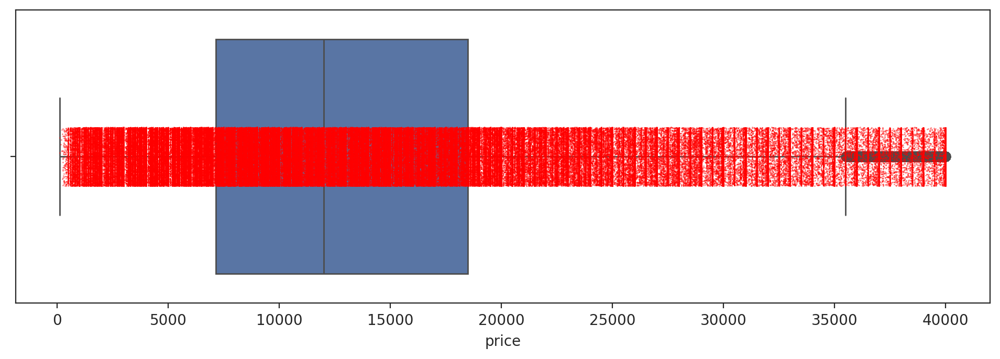

In [ ]:
plt.figure(figsize=(12, 8))
plt.subplot(2, 1, 1)
sns.boxplot(x=data['price'])
sns.stripplot(x=data['price'], color='red', size=1, jitter=True, alpha=0.5)


In [ ]:
sorted(data['year_of_registration'].unique())

[999.0,
 1006.0,
 1007.0,
 1008.0,
 1009.0,
 1010.0,
 1015.0,
 1016.0,
 1017.0,
 1063.0,
 1515.0,
 1909.0,
 1933.0,
 1934.0,
 1950.0,
 1952.0,
 1954.0,
 1955.0,
 1956.0,
 1957.0,
 1958.0,
 1959.0,
 1960.0,
 1961.0,
 1962.0,
 1963.0,
 1964.0,
 1965.0,
 1966.0,
 1967.0,
 1968.0,
 1969.0,
 1970.0,
 1971.0,
 1972.0,
 1973.0,
 1974.0,
 1975.0,
 1976.0,
 1977.0,
 1978.0,
 1979.0,
 1980.0,
 1981.0,
 1982.0,
 1983.0,
 1984.0,
 1985.0,
 1986.0,
 1987.0,
 1988.0,
 1989.0,
 1990.0,
 1991.0,
 1992.0,
 1993.0,
 1994.0,
 1995.0,
 1996.0,
 1997.0,
 1998.0,
 1999.0,
 2000.0,
 2001.0,
 2002.0,
 2003.0,
 2004.0,
 2005.0,
 2006.0,
 2007.0,
 2008.0,
 2009.0,
 2010.0,
 2011.0,
 2012.0,
 2013.0,
 2014.0,
 2015.0,
 2016.0,
 2017.0,
 2018.0,
 2019.0,
 2020.0]

In [ ]:
df = data['year_of_registration'].unique()
df.sort()
df

array([ 999., 1006., 1007., 1008., 1009., 1010., 1015., 1016., 1017.,
       1063., 1515., 1909., 1933., 1934., 1950., 1952., 1954., 1955.,
       1956., 1957., 1958., 1959., 1960., 1961., 1962., 1963., 1964.,
       1965., 1966., 1967., 1968., 1969., 1970., 1971., 1972., 1973.,
       1974., 1975., 1976., 1977., 1978., 1979., 1980., 1981., 1982.,
       1983., 1984., 1985., 1986., 1987., 1988., 1989., 1990., 1991.,
       1992., 1993., 1994., 1995., 1996., 1997., 1998., 1999., 2000.,
       2001., 2002., 2003., 2004., 2005., 2006., 2007., 2008., 2009.,
       2010., 2011., 2012., 2013., 2014., 2015., 2016., 2017., 2018.,
       2019., 2020.])

In [ ]:
filtered_data1 = data[data['year_of_registration'] < 1800]
count_of_rows = filtered_data1.shape[0]
print("Number of rows where year_of_registration is less than 1800:", count_of_rows)


Number of rows where year_of_registration is less than 1800: 16


In [ ]:
data = data[data['year_of_registration'] >= 1800]

# Now, 'data' contains only rows where year_of_registration is greater than or equal to 1800


In [ ]:
# Feature Engineering
current_year = 2024
data['vehicle_age'] = current_year - filtered_data['year_of_registration']
data.loc[data['vehicle_condition'] == 'NEW', 'vehicle_age'] = 0
quantitative_features.append('vehicle_age')
vehicle_age_distribution = data['vehicle_age'].describe()
vehicle_age_outliers = ((data['vehicle_age'] < (vehicle_age_distribution['25%'] - 1.5 * (vehicle_age_distribution['75%'] - vehicle_age_distribution['25%']))) |
                        (data['vehicle_age'] > (vehicle_age_distribution['75%'] + 1.5 * (vehicle_age_distribution['75%'] - vehicle_age_distribution['25%'])))).sum()

vehicle_age_distribution, vehicle_age_outliers

(count    376486.000000
 mean          8.465133
 std           4.668637
 min           0.000000
 25%           6.000000
 50%           8.000000
 75%          11.000000
 max         115.000000
 Name: vehicle_age, dtype: float64,
 11362)

## visualization

In [ ]:
fig = px.histogram(data, x="standard_make",
                   labels = {"car_name": "manufacturer"},
                   title= "Manufacturer of the car",
                   color_discrete_sequence=["hotpink"])
fig.show()

In [ ]:
# scatter plot
fig = px.scatter(data, x='standard_make',
                 color_continuous_scale='Portland', title='Scatter Plot with Portland Color Scale')

fig.update_layout(xaxis_title='Manufacturer', yaxis_title='count')

fig.show()


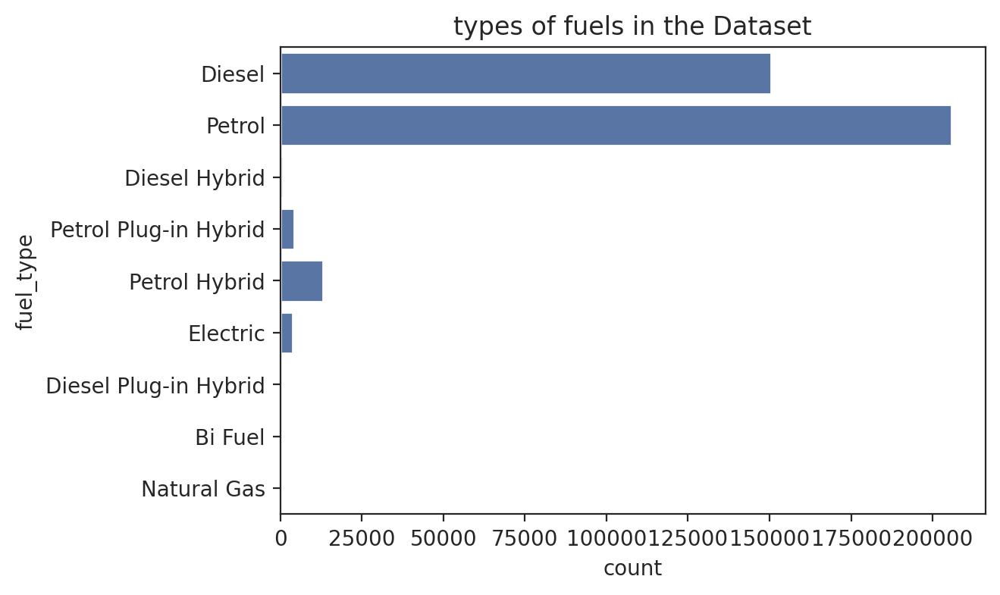

In [ ]:
#here i wanted to check how many fuel types are there and i visualized it using countplot

sns.countplot(y='fuel_type', data=data)
plt.title('types of fuels in the Dataset')
plt.show()

In [ ]:
data.isnull().sum()

mileage                     0
reg_code                    0
standard_colour             0
standard_make               0
standard_model              0
vehicle_condition           0
year_of_registration        0
price                       0
body_type                   0
crossover_car_and_van       0
fuel_type                   0
vehicle_age              1764
dtype: int64

In [ ]:
data.dropna(subset=['vehicle_age'], inplace=True)


In [ ]:
data['vehicle_age'] = data['vehicle_age'].astype(int)


In [ ]:
data['year_of_registration'] = data['year_of_registration'].astype(int)


In [ ]:
data.vehicle_age.unique()

array([ 13,   7,   8,   9,  11,  16,  14,   5,   0,  12,   6,  15,  10,
        21,  18,   4,  19,  24,  22,  17,  20,  33,  23,  38,  26,  34,
        31,  37,  30,  25,  29,  27,  55,  40,  32,  36,  35,  28,  48,
        44,  57,  52,  56,  54,  45,  91,  43,  39,  46,  53,  51,  50,
        58,  42,  47,  63,  41,  59,  67,  70,  49,  60,  69,  62,  65,
       115,  61,  90,  66,  74,  68,  64,  72])

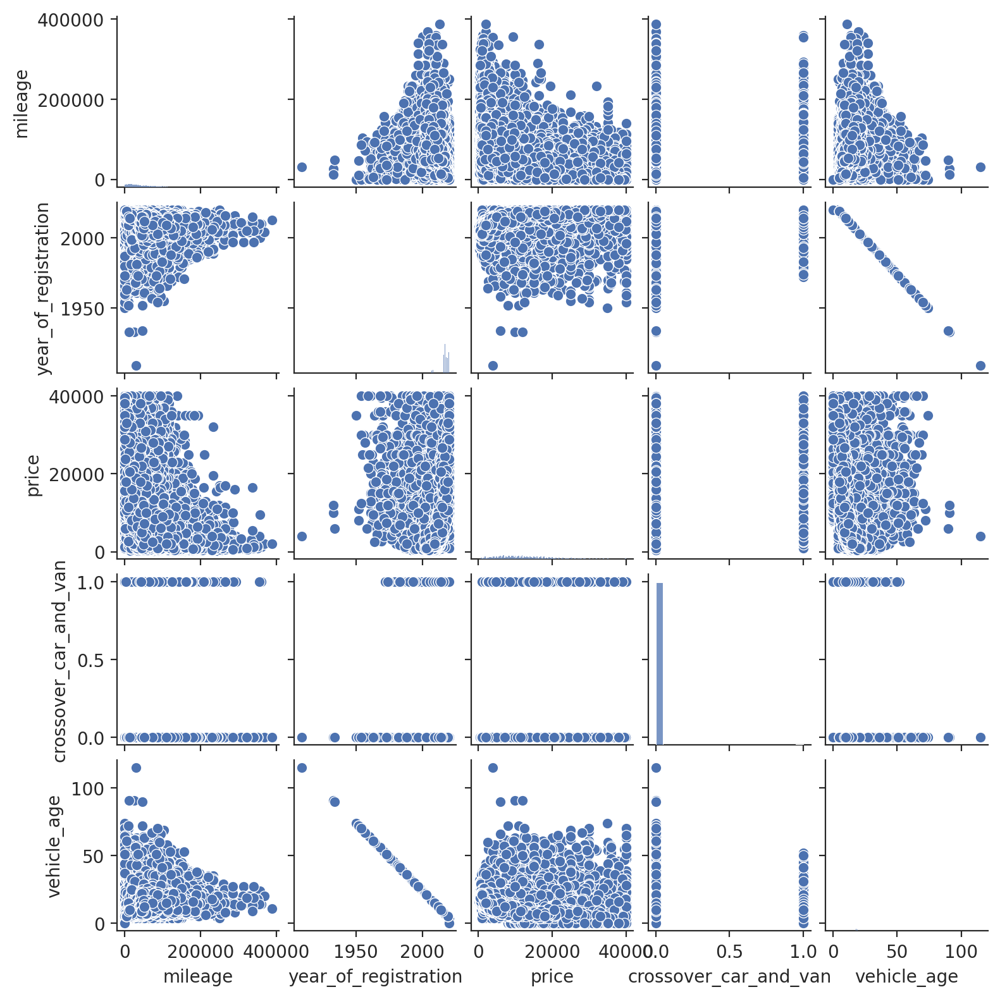

In [ ]:
sns.pairplot(data=data, height=1.6);

In [ ]:
data

,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,vehicle_age
public_reference,,,,,,,,,,,,
202007020778260,108230.0,61,Blue,Jaguar,XF,USED,2011,7000.0,Saloon,False,Diesel,13
202007020778474,7800.0,17,Grey,SKODA,Yeti,USED,2017,14000.0,SUV,False,Petrol,7
202007080986776,45000.0,16,Brown,Vauxhall,Mokka,USED,2016,7995.0,Hatchback,False,Diesel,8
202007161321269,64000.0,64,Grey,Land Rover,Range Rover Sport,USED,2015,26995.0,SUV,False,Diesel,9
202009304412074,16000.0,17,Blue,Audi,S5,USED,2017,29000.0,Convertible,False,Petrol,7
...,...,...,...,...,...,...,...,...,...,...,...,...
202010315652942,5179.0,69,Grey,Peugeot,208,USED,2019,10595.0,Hatchback,False,Petrol,5
202010315657341,110000.0,59,Red,Peugeot,107,USED,2009,2000.0,Hatchback,False,Petrol,15
202010315659271,52760.0,62,White,Nissan,Qashqai,USED,2012,7250.0,SUV,False,Petrol,12


## quantitative- quantitative categories





Text(0.5, 1.0, 'Regression Plot of Vehicle Age and price')

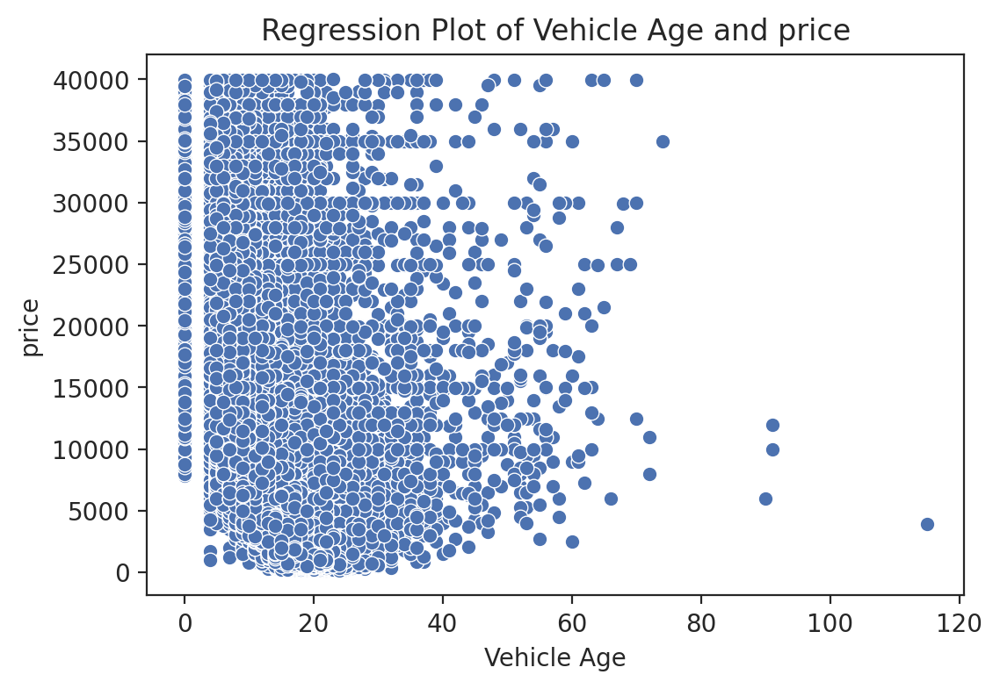

In [ ]:
sns.scatterplot(x='vehicle_age', y='price', data=data)
plt.xlabel('Vehicle Age')
plt.ylabel('price')
plt.title('Regression Plot of Vehicle Age and price')

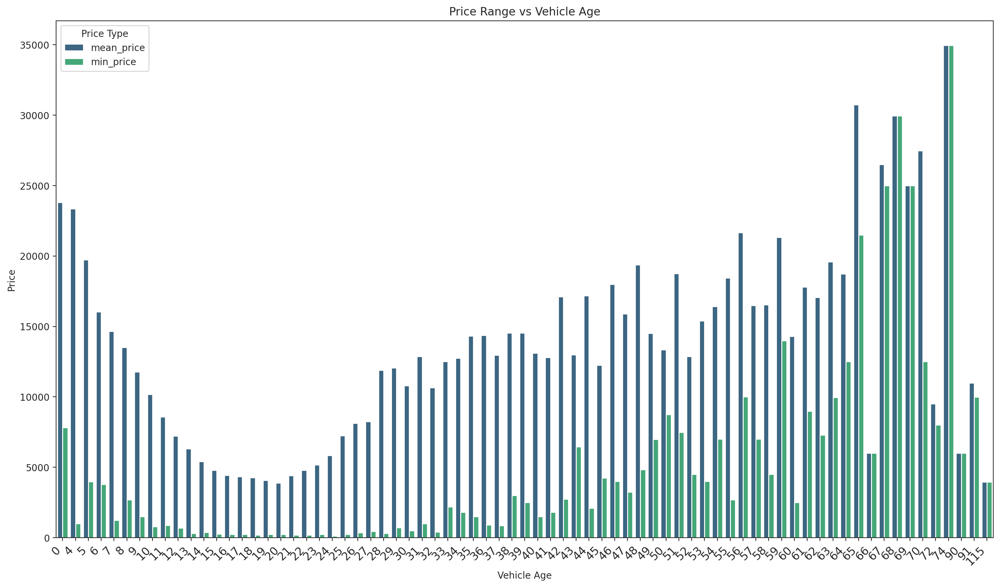

In [ ]:
grouped_age_df = data.groupby('vehicle_age').agg({'price': ['mean', 'min']}).reset_index()
grouped_age_df.columns = ['vehicle_age', 'mean_price', 'min_price']
stacked_df = grouped_age_df.melt('vehicle_age', var_name='price_type', value_name='price')

plt.figure(figsize=(18, 10))
sns.barplot(x='vehicle_age', y='price', hue='price_type', data=stacked_df, palette='viridis')
plt.title('Price Range vs Vehicle Age')
plt.xlabel('Vehicle Age')
plt.ylabel('Price')
plt.legend(title='Price Type')
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.show()


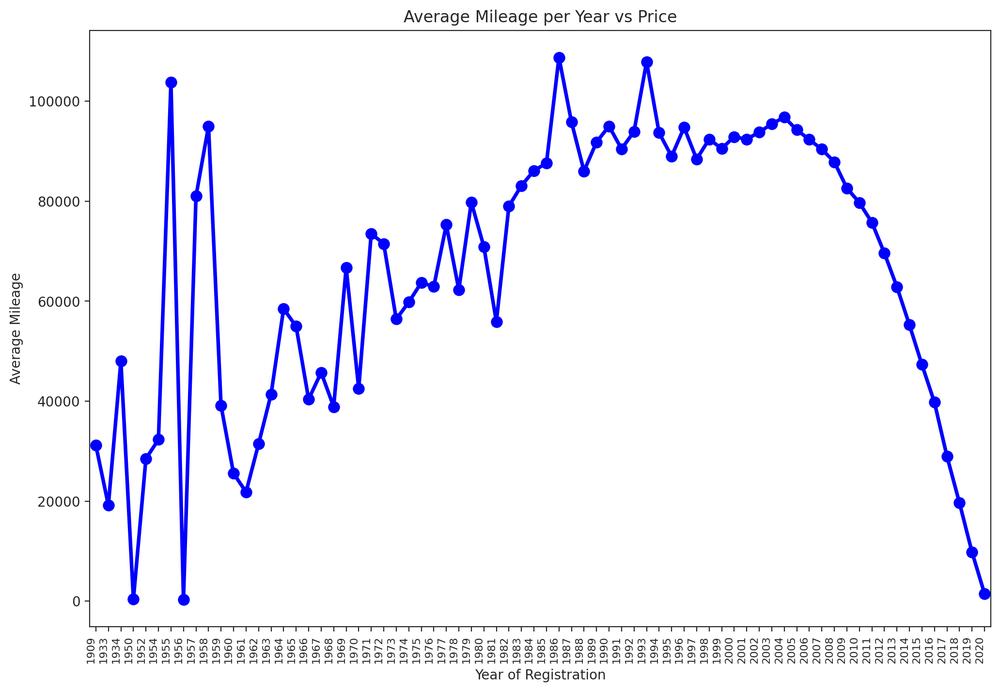

In [ ]:
average_mileage_per_year = data.groupby('year_of_registration')['mileage'].mean().reset_index()
plt.figure(figsize=(12, 8))
sns.pointplot(data=average_mileage_per_year, x='year_of_registration', y='mileage', color='blue')
plt.xlabel("Year of Registration")
plt.ylabel("Average Mileage")
plt.title("Average Mileage per Year vs Price")
plt.xticks(rotation=90, ha='right', fontsize=8)
plt.show()

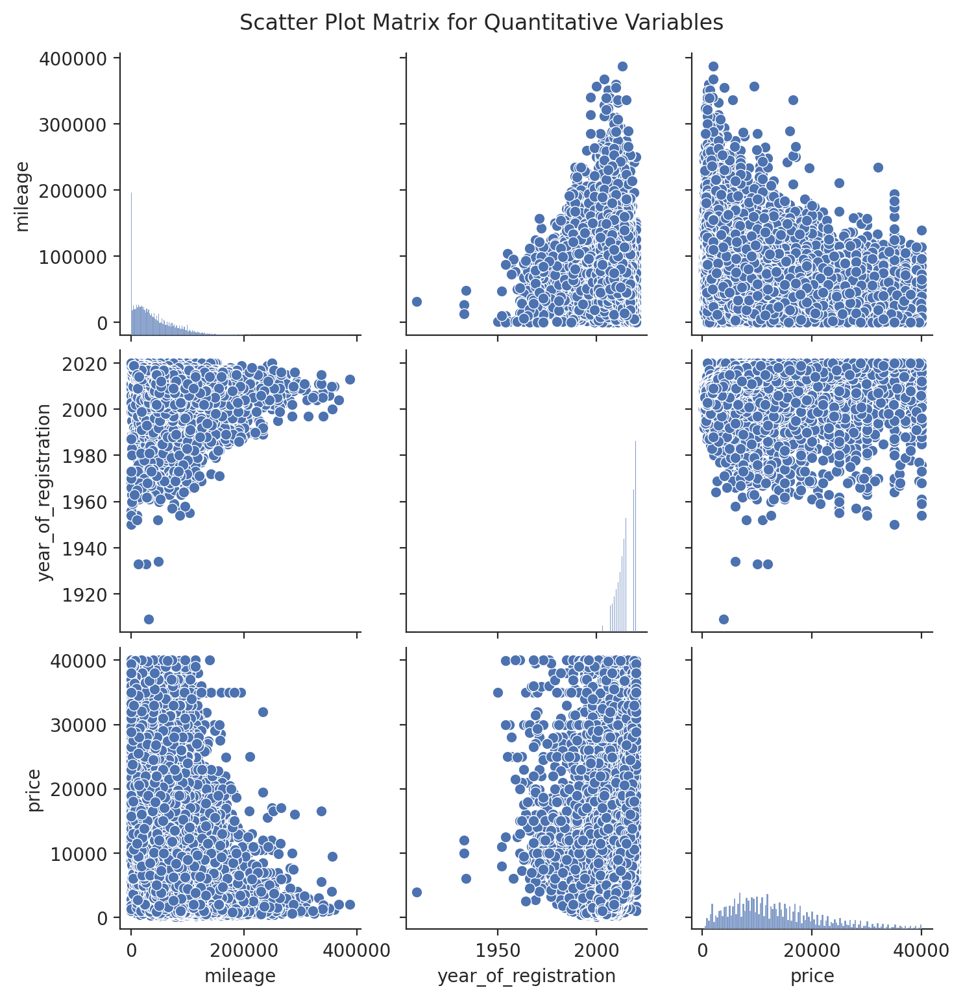

,mileage,year_of_registration,price
mileage,1.00000,-0.727230,-0.547990
year_of_registration,-0.72723,1.000000,0.569097
price,-0.54799,0.569097,1.000000


In [ ]:
# pairplot representation to understand in detail
quantitative_vars = ['mileage', 'year_of_registration', 'price']
quantitative_correlation = data[quantitative_vars].corr()
sns.pairplot(data[quantitative_vars])
plt.suptitle("Scatter Plot Matrix for Quantitative Variables", y=1.02)
plt.show()

quantitative_correlation

Quantitative-Quantitative Associations Analysis
Correlation Results:

Mileage and Year of Registration: Negative correlation indicates that vehicles which are new has low mileage.

Mileage and Price: the graph is negative correlation which indicates high mileage lower will be the price

Year of Registration and Price: Positive correlation New cars have higher price.

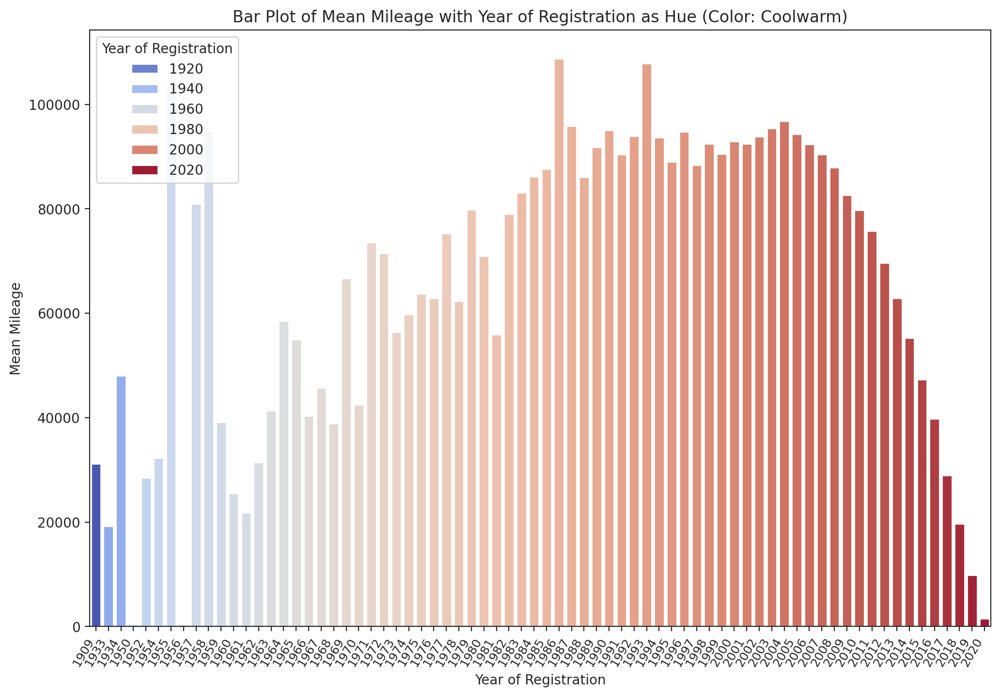

In [ ]:
data['year_of_registeration'] = data['year_of_registration'].astype(int)
plt.figure(figsize=(12, 8))
sns.barplot(data=data, x="year_of_registration", y="mileage", hue="year_of_registration", palette="coolwarm", ci=None)
plt.xlabel("Year of Registration")
plt.ylabel("Mean Mileage")
plt.title("Bar Plot of Mean Mileage with Year of Registration as Hue (Color: Coolwarm)")
plt.legend(title='Year of Registration', loc='upper left')
plt.xticks(rotation=60, ha='right', fontsize=9)
plt.show()

## quantitative- category

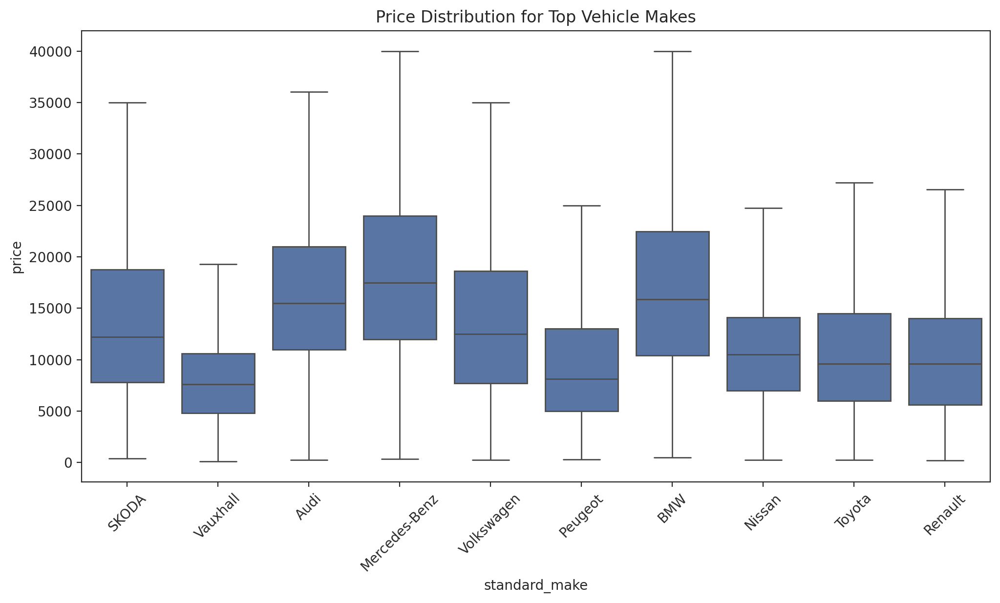

In [ ]:
top_makes = data['standard_make'].value_counts().nlargest(10).index
filtered_data_for_make = data[data['standard_make'].isin(top_makes)]
plt.figure(figsize=(12, 6))
sns.boxplot(x='standard_make', y='price', data=filtered_data_for_make, showfliers=False)
plt.xticks(rotation=45)
plt.title("Price Distribution for Top Vehicle Makes")
plt.show()

Quantitative-Categorical Association: Standard Make and Price
The box plot above shows the distribution of prices for the top vehicle makes. It's evident that different makes have varying price ranges and medians, indicating an association between the make of a vehicle and its price.

Some key observations:
Certain makes (like Mercedes-Benz, BMW) tend to have higher median prices.
The variability in price also differs among makes, as seen in the range of the box plots.
Luxury brands typically show a wider range and higher prices.

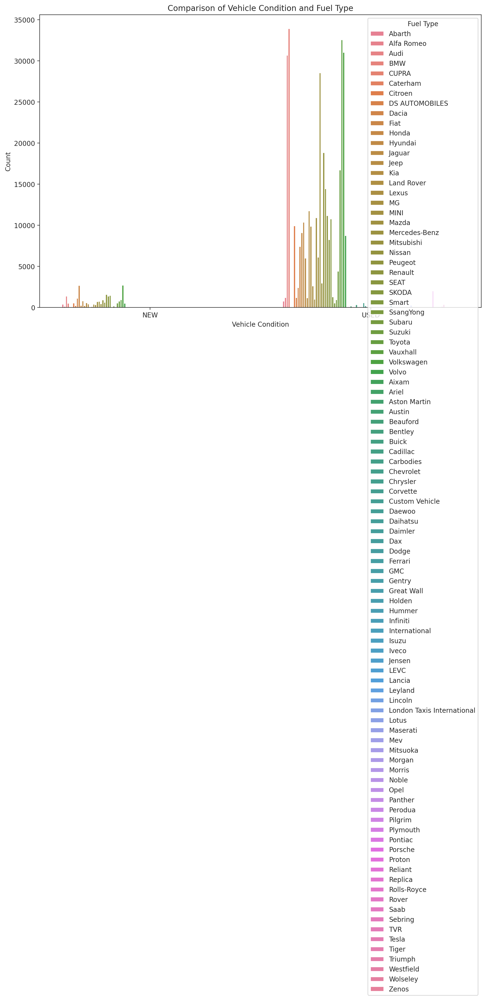

In [ ]:
count_data = data.groupby(['vehicle_condition', 'standard_make']).size().reset_index(name='count')
plt.figure(figsize=(12, 8))
sns.barplot(data=count_data, x='vehicle_condition', y='count', hue='standard_make')
plt.xlabel('Vehicle Condition')
plt.ylabel('Count')
plt.title('Comparison of Vehicle Condition and Fuel Type')
plt.legend(title='Fuel Type', loc='upper right')


## category - category

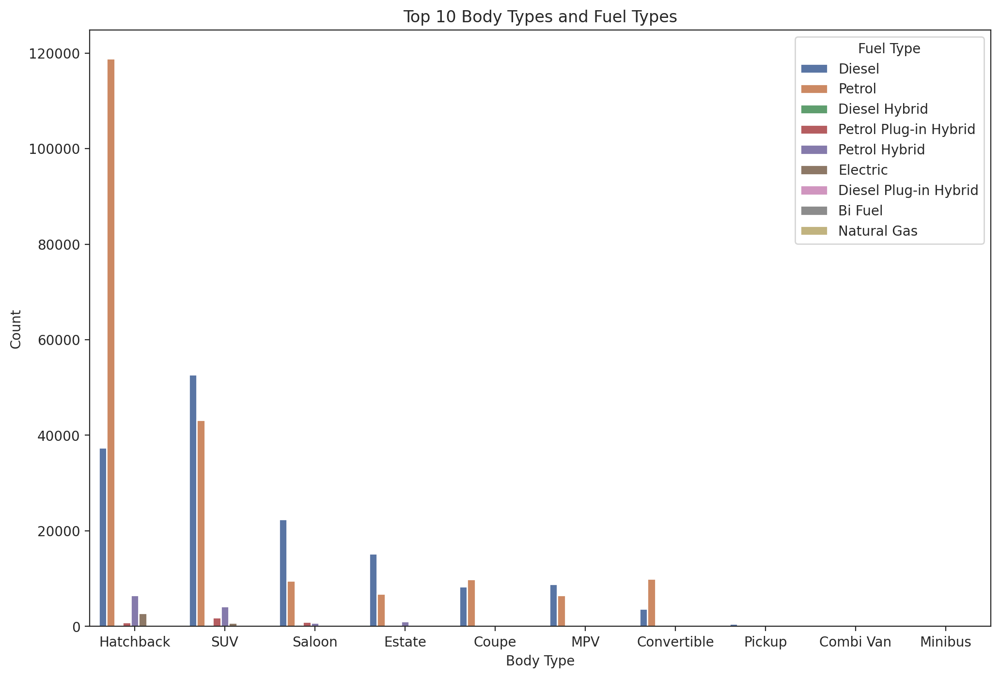

In [ ]:
top_body_types = data['body_type'].value_counts().head(10).index
filtered_data = data[data['body_type'].isin(top_body_types)]
plt.figure(figsize=(12, 8))
sns.countplot(data=filtered_data, x="body_type", hue="fuel_type", order=top_body_types)
plt.xlabel("Body Type")
plt.ylabel("Count")
plt.title("Top 10 Body Types and Fuel Types")
plt.legend(title='Fuel Type', loc='upper right')  # Add legend
plt.show()


Text(0.5, 1.0, 'Top 10 Body Types Countplot')

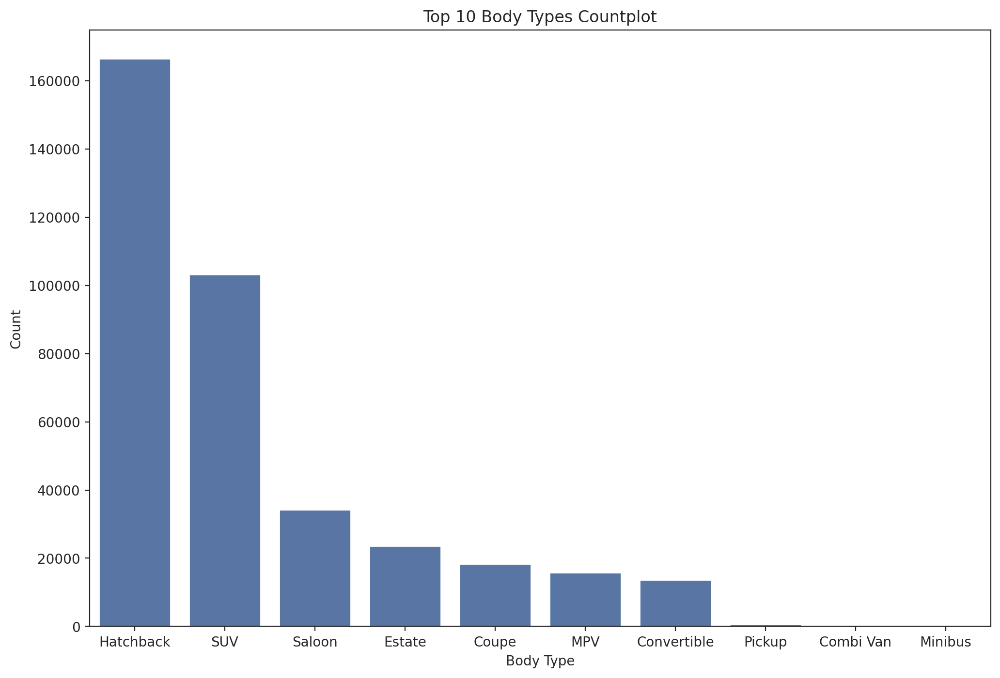

In [ ]:
top_body_types = data['body_type'].value_counts().head(10).index
filtered_data = data[data['body_type'].isin(top_body_types)]
plt.figure(figsize=(12, 8))
sns.countplot(data=filtered_data, x="body_type", order=top_body_types)
plt.xlabel("Body Type")
plt.ylabel("Count")
plt.title("Top 10 Body Types Countplot")

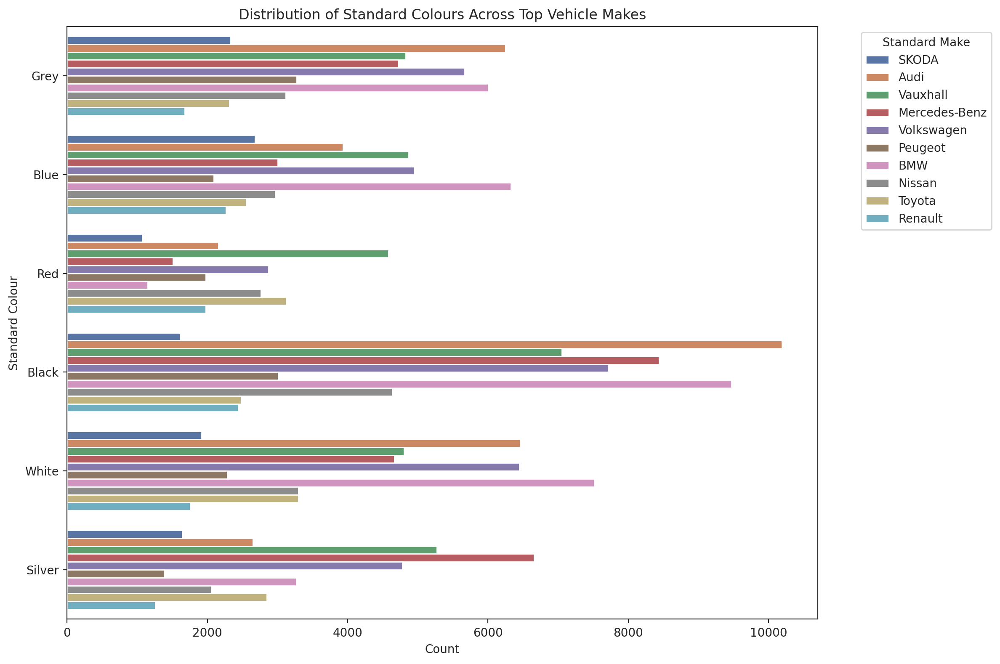

In [ ]:
top_colours = data['standard_colour'].value_counts().nlargest(6).index
top_makes = data['standard_make'].value_counts().nlargest(10).index
filtered_data_for_colour_make = data[data['standard_colour'].isin(top_colours) & data['standard_make'].isin(top_makes)]
plt.figure(figsize=(12, 8))
sns.countplot(y='standard_colour', hue='standard_make', data=filtered_data_for_colour_make)
plt.title("Distribution of Standard Colours Across Top Vehicle Makes")
plt.xlabel("Count")
plt.ylabel("Standard Colour")
plt.legend(title='Standard Make', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()
